# Let's Code by ADA
# Módulo 12 - Machine Learning II

## EDA / Análise de Segmentação / Análise Preditiva

**Professor:**<br> Carlos Stefano


**Alunos:** <br>
Eugenio Pacheco<br>
Isabella Beserra<br>
José Venancio<br>
Julia Muto<br>
Willker Menezes<br>


#### Dataset: https://www.kaggle.com/datasets/fedesoriano/stellar-classification-dataset-sdss17?resource=download


Este Dataset visa classificar estrelas, quasares e galáxias com base nas suas características espectrais. Consiste em 100.000 observações feitas pelo SDSS (Sloan Digital Sky Survey); cada observação é descrita por 17 features e uma coluna de classificação (target), definindo a observação como estrela, quasar ou galáxia.
### Metadados:<br>


- **obj_ID** - Identificador
- **alpha** - Ângulo de Ascensão Reta (na Época astronômica J2000 [atual])
- **delta** - Ângulo de Declinação (na Época astronômica J2000 [atual])
- **u** - Filtro ultravioleta no sistema fotométrico
- **g** - Filtro de luz verde no sistema fotométrico
- **r** - Filtro de luz vermelha no sistema fotométrico
- **i** - Filtro de radiação próxima ao infravermelho no sistema fotométrico
- **z** - Filtro de radiação infravermelha no sistema fotométrico
- **run_ID** - Número da execução usado para identificar uma leitura/scan específica
- **rerun_ID** - Número para especificar como a imagem foi prcessada
- **cam_col** - Coluna da câmera para identificar a linha de varredura dentro de uma dada execução
- **field_ID** - Número para identificar o campo de leitura
- **spec_obj_ID** - Identificador único para objetos espectroscópicos ópticos (duas observações com o mesmo 'spec_obj_ID' vão apresentar a mesma classe como target)
- **class** - Classe do objeto (estrela, galáxia ou quasar) [target]
- **redshift** - Valor do 'Desvio para o Vermelho' (afastamento do observador), com base no aumento do comprimento de onda
- **plate** - ID da placa, identifica cada placa do SDSS
- **MJD** - "Modified Julian Date" (Data Juliana Modificada), indica quando uma determinada parte dos dados do SDSS foi retirada.
- **fiber_ID** - Identifica a fibra apontada para a luz no plano focal de cada observação

<img src="https://sloan.org/storage/app/media/programs/science/SDSS/cropped-images/hero%20image%20sloan_telescope-0-182-1200-714-1462225014.jpg" width=630 height=315>

### Enunciado do projeto

- na etapa de análise exploratória de dados, o grupo seja capaz de entender o
problema de negócio ao qual o dataset escolhido se insere, sabendo levantar
perguntas de interesse, que deverão ser respondidas com embasamentos nas
análises de dados (avaliações gráficas, estatísticas e afins);
  - o objetivo é criar um modelo que faça a classificação dos objetos espaciais em estrela, quasar ou galáxia 
- para a avaliação de segmentação, espera-se que o grupo seja capaz de encontrar
agrupamentos no conjunto de dados, em relação a variáveis de interesse para o
problema proposto. Por exemplo, pensando em um dataset de compras de
determinados produtos, é possível associar perfis de consumidores a padrões
específicos de gastos? Como isso pode ser feito? (Apenas um exemplo; a ideia é
que vocês consigam transpor esse raciocínio ao dataset de vocês!);
- por fim, a análise preditiva pressupõe a utilização de modelos, a escolha do grupo,
para predizer a(s) variável(eis) de interesse dos problemas levantados pelo grupo.
Apesar de ser interessante vocês praticarem os algoritmos estudados neste módulo,
comparações com modelos previamente estudados são sempre bem-vindas!

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as st
import warnings
warnings.simplefilter(action='ignore', category=Warning)

In [2]:
df = pd.read_csv("star_classification.csv")

### Visão Geral

In [3]:
df.shape

(100000, 18)

In [4]:
df.head(5)

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842


In [5]:
df.info()

# Sem valores nulos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   obj_ID       100000 non-null  float64
 1   alpha        100000 non-null  float64
 2   delta        100000 non-null  float64
 3   u            100000 non-null  float64
 4   g            100000 non-null  float64
 5   r            100000 non-null  float64
 6   i            100000 non-null  float64
 7   z            100000 non-null  float64
 8   run_ID       100000 non-null  int64  
 9   rerun_ID     100000 non-null  int64  
 10  cam_col      100000 non-null  int64  
 11  field_ID     100000 non-null  int64  
 12  spec_obj_ID  100000 non-null  float64
 13  class        100000 non-null  object 
 14  redshift     100000 non-null  float64
 15  plate        100000 non-null  int64  
 16  MJD          100000 non-null  int64  
 17  fiber_ID     100000 non-null  int64  
dtypes: float64(10), int64(7),

In [6]:
df.sample(10)

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
68075,1.237652e+18,232.828858,1.925923,25.80128,22.44533,21.05690,20.06648,19.52078,1458,301,4,721,4.564534e+18,GALAXY,0.558141,4054,55358,495
83777,1.237671e+18,155.637415,18.555581,18.12101,17.18494,16.90135,16.80706,16.79196,5935,301,6,262,8.392621e+18,STAR,0.000686,7454,56751,592
67905,1.237666e+18,248.061868,11.719898,25.35876,20.16379,18.36810,17.74896,17.36150,4678,301,3,313,2.851970e+18,GALAXY,0.344310,2533,54585,239
56456,1.237664e+18,41.511462,-0.321251,20.86026,18.95937,18.11362,17.73421,17.43376,4263,301,3,393,1.757589e+18,GALAXY,0.076388,1561,53032,216
48752,1.237679e+18,29.663601,-1.307080,21.24195,20.48004,20.36713,20.29304,19.94082,7780,301,6,100,4.896766e+18,QSO,2.182095,4349,55803,826
1661,1.237668e+18,237.643521,10.763762,18.94124,18.03001,17.66418,17.53177,17.45580,5322,301,3,187,5.496768e+18,STAR,0.000499,4882,55721,452
39320,1.237671e+18,149.389032,16.123288,19.88511,18.41444,17.64762,17.30062,17.07003,5935,301,3,220,2.910530e+18,GALAXY,0.084773,2585,54097,286
64945,1.237654e+18,138.265113,51.915083,24.63471,21.50378,20.35737,19.56347,22.82693,2074,301,2,127,6.450352e+18,QSO,1.554735,5729,56598,259
75129,1.237661e+18,152.885916,40.022669,21.44415,21.25387,20.75068,20.66908,20.43985,3562,301,3,39,9.937348e+18,QSO,1.026770,8826,57452,566
34919,1.237653e+18,347.965063,-9.204812,22.45391,20.39421,18.73336,18.01201,17.61171,1854,301,4,83,8.175378e+17,GALAXY,0.371270,726,52226,489


In [7]:
#remoção de identificador do objeto

df.drop(columns=['obj_ID', 'rerun_ID'], inplace=True)

# rerun_ID é sempre 301

# Queria conversar com vocês sobre se vale a pena deixar as outras colunas de ID.
# Se alguma placa ou fibra estiver defeituosa e afetar o resultado, a gente saberia pelo ID delas

## 1. Análise Exploratória dos Dados

In [8]:
df.describe().round()

,alpha,delta,u,g,r,i,z,run_ID,cam_col,field_ID,spec_obj_ID,redshift,plate,MJD,fiber_ID
count,100000.0,100000.0,100000.0,100000.0,100000.0,100000.0,100000.0,100000.0,100000.0,100000.0,1.000000e+05,100000.0,100000.0,100000.0,100000.0
mean,178.0,24.0,22.0,21.0,20.0,19.0,19.0,4481.0,4.0,186.0,5.783882e+18,1.0,5137.0,55589.0,449.0
std,97.0,20.0,32.0,32.0,2.0,2.0,32.0,1965.0,2.0,149.0,3.324016e+18,1.0,2952.0,1808.0,272.0
min,0.0,-19.0,-9999.0,-9999.0,10.0,9.0,-9999.0,109.0,1.0,11.0,2.995191e+17,-0.0,266.0,51608.0,1.0
25%,128.0,5.0,20.0,19.0,18.0,18.0,17.0,3187.0,2.0,82.0,2.844138e+18,0.0,2526.0,54234.0,221.0
50%,181.0,24.0,22.0,21.0,20.0,19.0,19.0,4188.0,4.0,146.0,5.614883e+18,0.0,4987.0,55868.0,433.0
75%,234.0,40.0,24.0,22.0,21.0,20.0,20.0,5326.0,5.0,241.0,8.332144e+18,1.0,7400.0,56777.0,645.0
max,360.0,83.0,33.0,32.0,30.0,32.0,29.0,8162.0,6.0,989.0,1.412694e+19,7.0,12547.0,58932.0,1000.0


In [9]:
# Sem leituras duplicadas

df.duplicated().sum()

0

In [10]:
df['class'].value_counts(normalize=True)*100

# Dataset desbalanceado, temos muito mais GALAXY

GALAXY    59.445
STAR      21.594
QSO       18.961
Name: class, dtype: float64

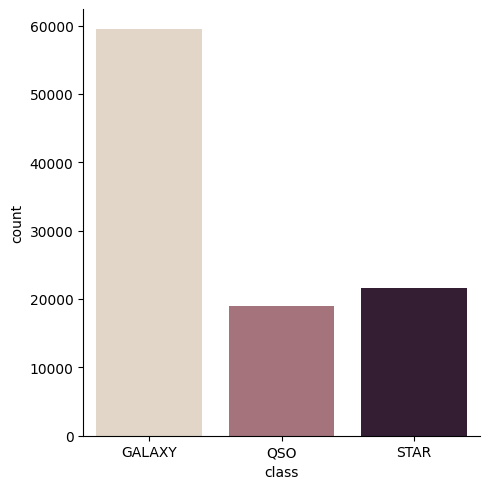

In [15]:
sns.catplot(df, x="class", kind="count", palette="ch:.25")

<Axes: xlabel='alpha', ylabel='class'>

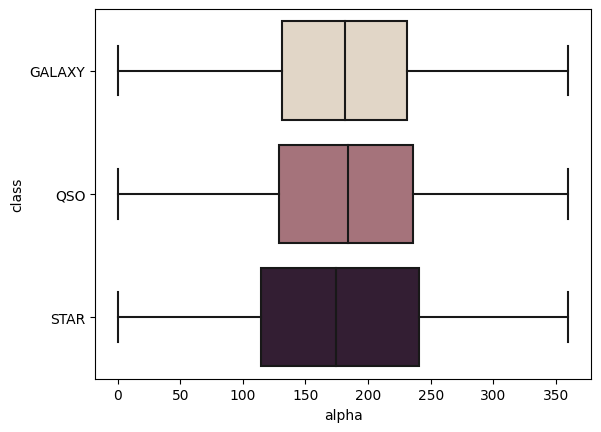

In [27]:
sns.boxplot(df, x='alpha', y='class', palette="ch:.25")

<Axes: xlabel='delta', ylabel='class'>

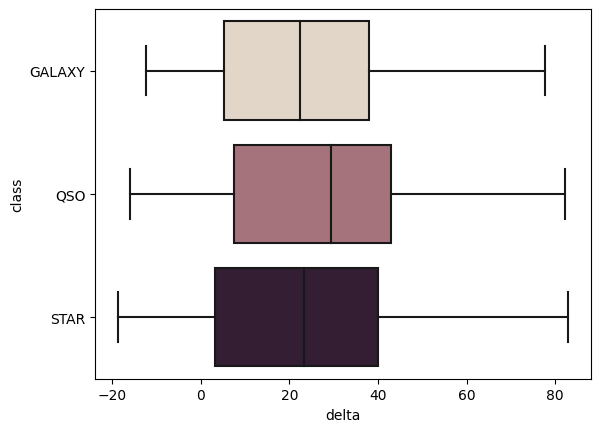

In [28]:
sns.boxplot(df, x='delta', y='class', palette="ch:.25")

In [10]:
# Definindo a Matriz de Correlação

df.corr(numeric_only=True).round(4)

,alpha,delta,u,g,r,i,z,run_ID,cam_col,field_ID,spec_obj_ID,redshift,plate,MJD,fiber_ID
alpha,1.0000,0.1387,-0.0015,-0.0024,-0.0221,-0.0236,-0.0029,-0.0137,0.0196,-0.1656,-0.0026,0.0017,-0.0026,0.0199,0.0305
delta,0.1387,1.0000,0.0021,0.0035,-0.0068,-0.0045,0.0036,-0.3012,0.0326,-0.1734,0.1123,0.0316,0.1123,0.1073,0.0282
u,-0.0015,0.0021,1.0000,0.9993,0.0541,0.0457,0.9981,0.0153,0.0035,-0.0084,0.0300,0.0143,0.0300,0.0320,0.0163
g,-0.0024,0.0035,0.9993,1.0000,0.0624,0.0563,0.9992,0.0157,0.0035,-0.0089,0.0394,0.0230,0.0394,0.0403,0.0175
r,-0.0221,-0.0068,0.0541,0.0624,1.0000,0.9629,0.0537,0.1539,0.0085,-0.0264,0.6552,0.4332,0.6552,0.6712,0.2231
i,-0.0236,-0.0045,0.0457,0.0563,0.9629,1.0000,0.0560,0.1477,0.0076,-0.0267,0.6616,0.4924,0.6616,0.6725,0.2148
z,-0.0029,0.0036,0.9981,0.9992,0.0537,0.0560,1.0000,0.0138,0.0034,-0.0089,0.0378,0.0304,0.0378,0.0375,0.0147
run_ID,-0.0137,-0.3012,0.0153,0.0157,0.1539,0.1477,0.0138,1.0000,-0.0471,0.0315,0.2395,0.0654,0.2395,0.2627,0.0672
cam_col,0.0196,0.0326,0.0035,0.0035,0.0085,0.0076,0.0034,-0.0471,1.0000,-0.0157,-0.0019,0.0001,-0.0019,-0.0067,0.1216
field_ID,-0.1656,-0.1734,-0.0084,-0.0089,-0.0264,-0.0267,-0.0089,0.0315,-0.0157,1.0000,-0.0835,-0.0213,-0.0835,-0.0951,-0.0123


<Axes: >

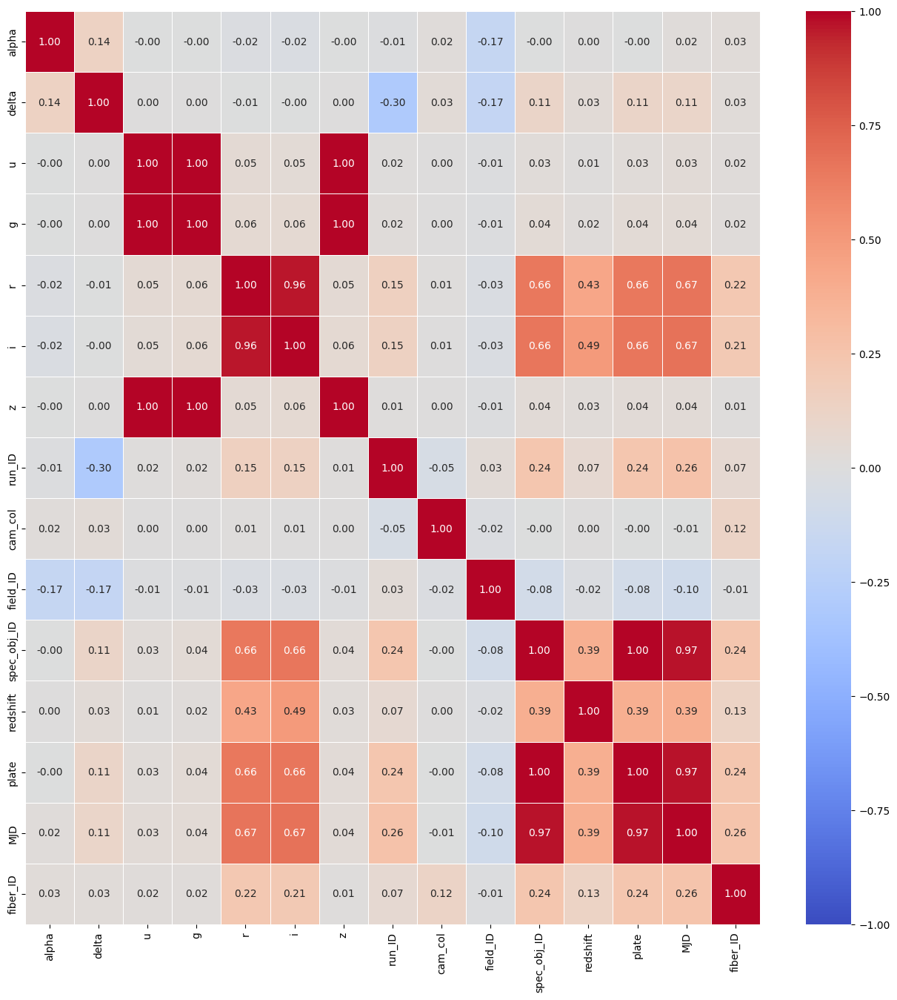

In [11]:
plt.figure(figsize=(16,16))
sns.heatmap(df.corr(), vmax=1, vmin=-1, cmap='coolwarm', annot=True, linewidths=0.5, fmt='.2f')

#o que fazer com essas variáveis que tem correlação 1?

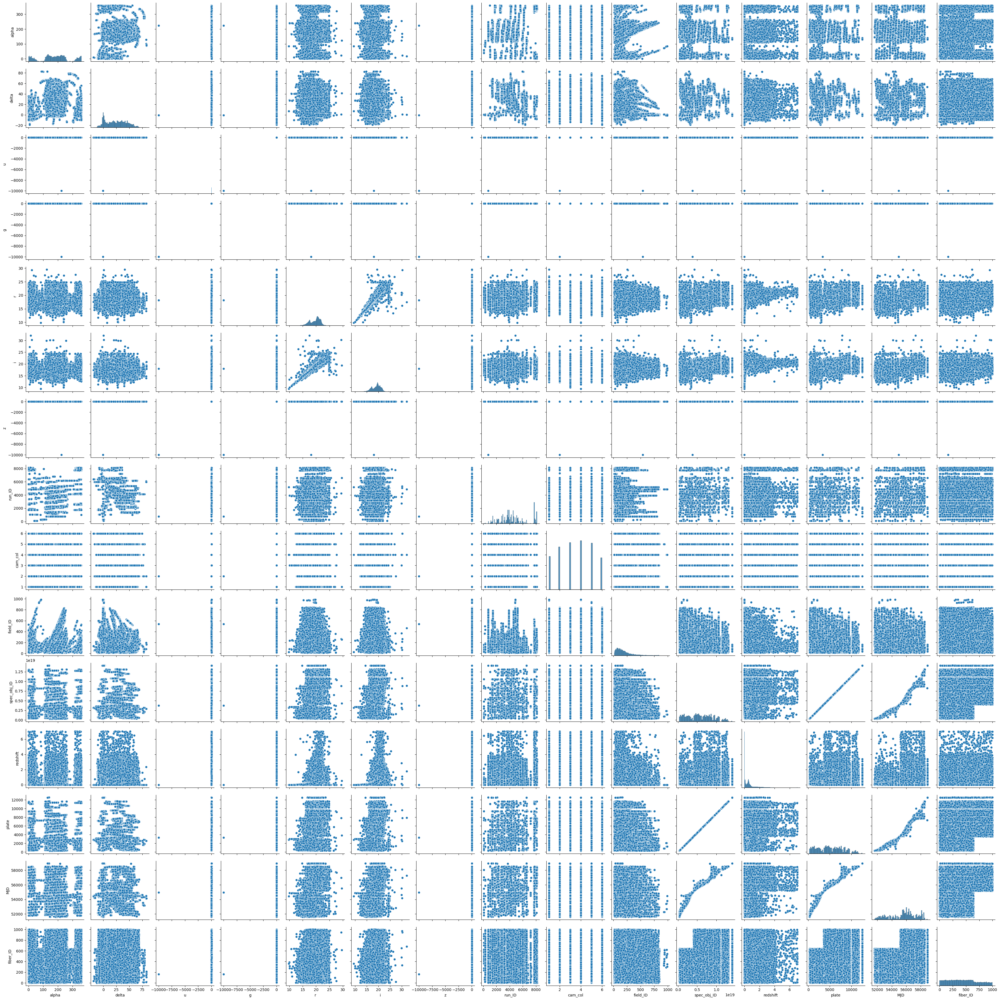

In [12]:
sns.pairplot(df)

# Tá MUITO pesado pra rodar, e não excluí as discretas, mas tem uma ou outra correlação interessante

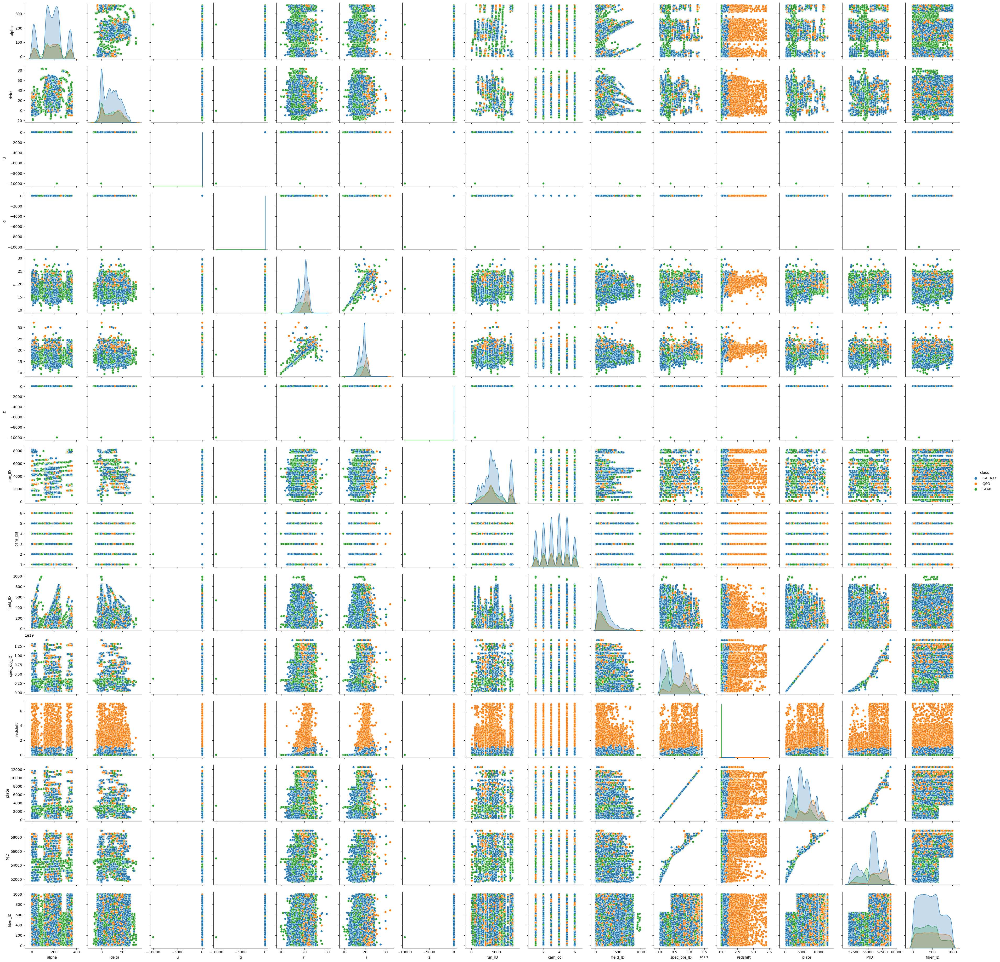

In [13]:
sns.pairplot(df, hue="class")

<Axes: xlabel='alpha', ylabel='delta'>

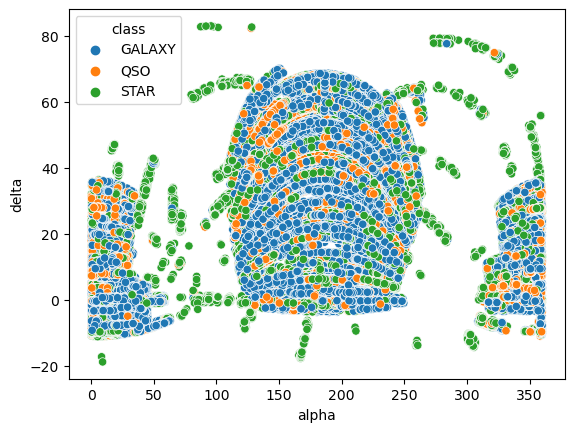

In [11]:
sns.scatterplot(df, x='alpha', y='delta', hue='class')

#parece um inseto!

<Axes: xlabel='r', ylabel='i'>

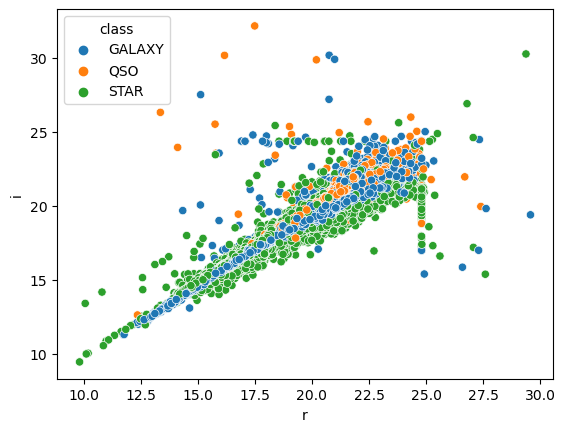

In [12]:
sns.scatterplot(df, x='r', y='i', hue='class')

<Axes: xlabel='i', ylabel='redshift'>

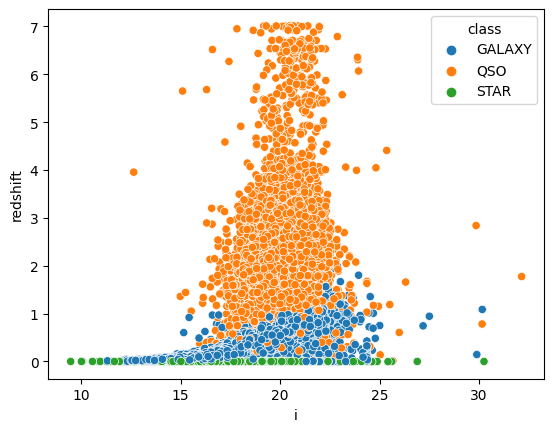

In [33]:
sns.scatterplot(df, x='i', y='redshift', hue='class')

<Axes: xlabel='r', ylabel='redshift'>

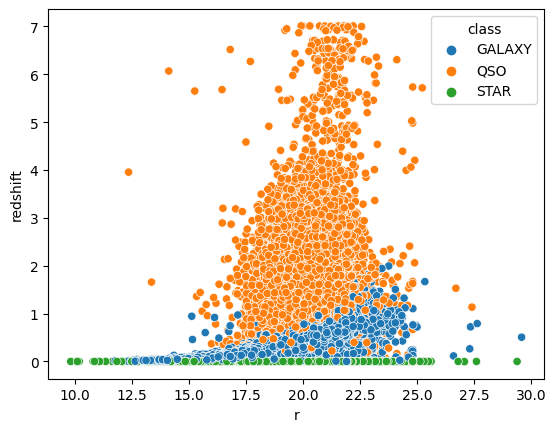

In [34]:
sns.scatterplot(df, x='r', y='redshift', hue='class')

<AxesSubplot: title={'center': 'Intensidade de Luz Vermelha por Classe'}, xlabel='Classe do Objeto', ylabel='r'>

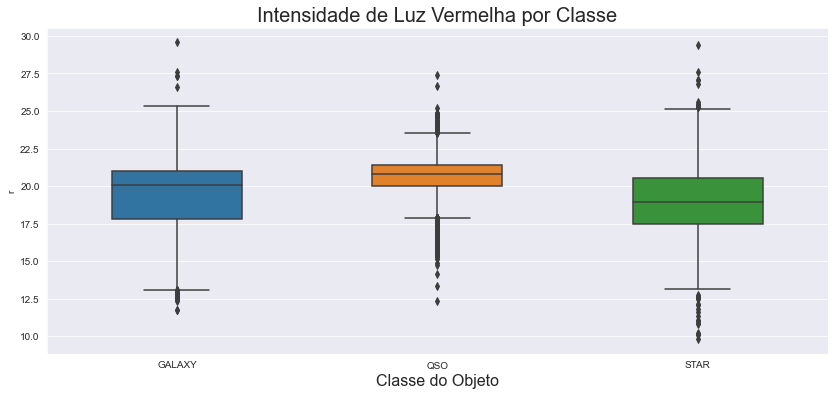

In [ ]:
sns.set_style('darkgrid')

ax = sns.boxplot(y='r',x='class',data=df,orient='v',width=0.5)
ax.figure.set_size_inches(14,6)
ax.set_title('Intensidade de Luz Vermelha por Classe',fontsize=20)
ax.set_xlabel('Classe do Objeto',fontsize=16)
ax

<AxesSubplot: title={'center': 'Valor do Desvio para o Vermelho por Classe'}, xlabel='Classe do Objeto', ylabel='redshift'>

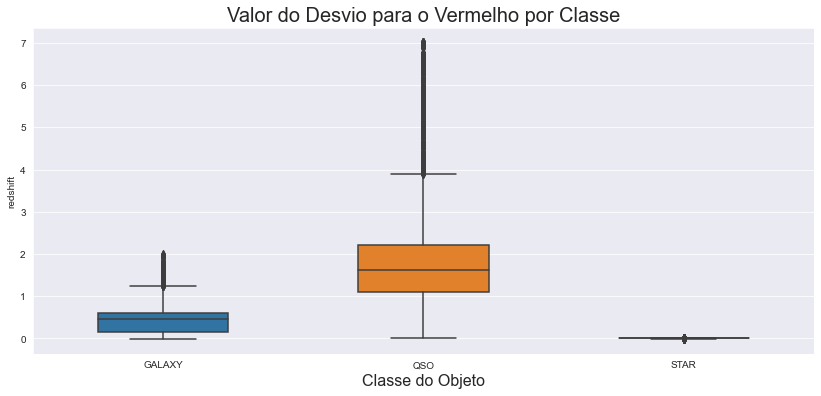

In [ ]:
sns.set_style('darkgrid')

ax = sns.boxplot(y='redshift',x='class',data=df,orient='v',width=0.5)
ax.figure.set_size_inches(14,6)
ax.set_title('Valor do Desvio para o Vermelho por Classe',fontsize=20)
ax.set_xlabel('Classe do Objeto',fontsize=16)
ax

# Verificar correlação. Objetos de massa maior se afastam com maior velocidade?
# Quanto mais distante o objeto, mais rápido ele se move, independente da massa (Lei de Hubble)

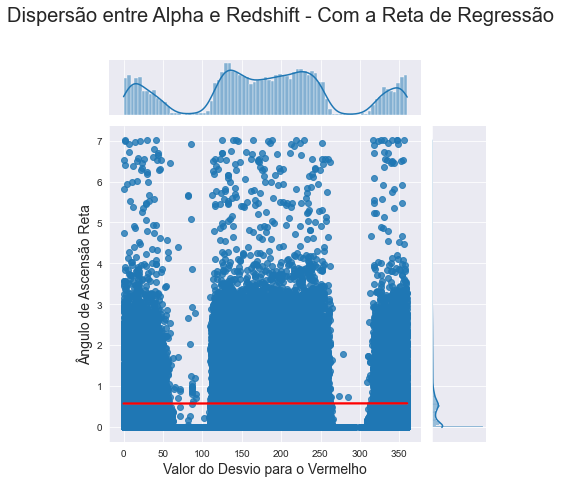

In [ ]:
ax = sns.jointplot(x='alpha',y='redshift',data=df,kind='reg', joint_kws={'line_kws':{'color':'red'}})
ax.fig.suptitle('Dispersão entre Alpha e Redshift - Com a Reta de Regressão',fontsize=20,y=1.1)
ax.set_axis_labels('Valor do Desvio para o Vermelho','Ângulo de Ascensão Reta',fontsize=14)
#regline = ax.ax_joint.get_lines()[0]
#regline.set_color('red')
#regline.set_zorder(5)
ax

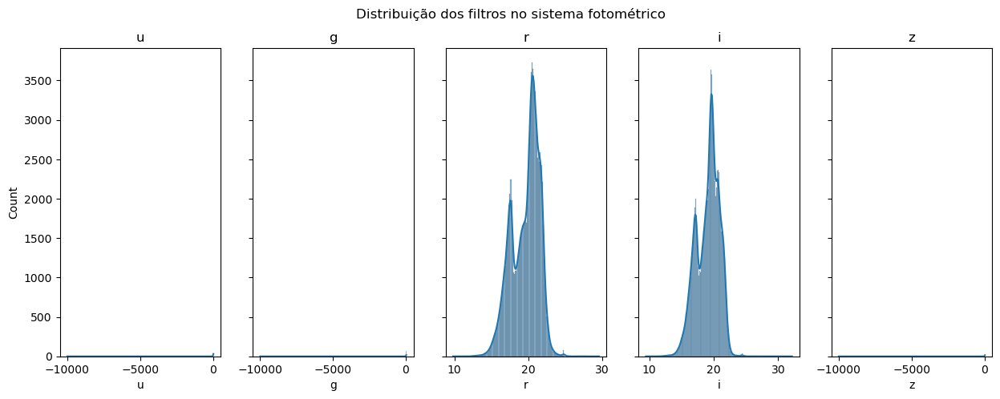

In [13]:
#plotei todos os filtros pq eu aprendi a fazer isso e quero usar ahhahaha
#daí não precisaria dos dois de baixo

fig, axes = plt.subplots(1, 5, figsize=(15, 5), sharey=True)
fig.suptitle('Distribuição dos filtros no sistema fotométrico')

filtros = ['u','g','r','i','z']

for i, filtro in enumerate(filtros):
    sns.histplot(df, x=filtro, ax=axes[i], kde=True)
    axes[i].set_title(filtro)

<AxesSubplot: xlabel='r', ylabel='Count'>

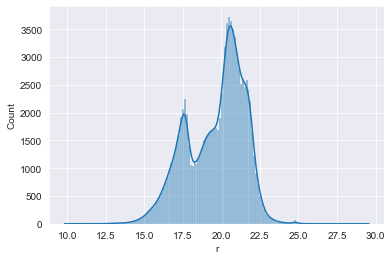

In [ ]:
sns.histplot(df, x="r", kde=True)

<AxesSubplot: xlabel='i', ylabel='Count'>

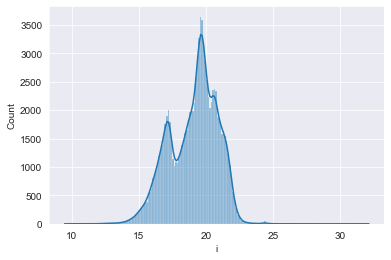

In [ ]:
sns.histplot(df, x="i", kde=True)